In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
%matplotlib inline

In [ ]:

from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)
# df_decades = pd.read_csv("/content/gdrive/MyDrive/CS 7641/")


Mounted at /content/gdrive/


In [ ]:
%cd

/root


In [ ]:
#read the 20s dataset
df_20s = pd.read_csv("/content/gdrive/MyDrive/CS 7641/NBA Dataset Decades - 20s.csv")
df_20s.head()


,win,fgm,fga,fgpct,fg3m,fg3a,fg3_pct,ftm,fta,ft_pct,oreb,dreb,reb,ast,stl,blk,tov,pf,pts,plus_minus
0,1,47,98,0.480,14,36,0.389,9,14,0.643,9,46,55,29,3,6,7,14,117,24
1,1,43,90,0.478,7,28,0.250,24,34,0.706,13,32,45,25,9,5,13,17,117,10
2,1,40,94,0.426,9,36,0.250,17,26,0.654,12,48,60,24,4,12,17,22,106,2
3,1,44,90,0.489,14,34,0.412,26,31,0.839,7,34,41,26,9,8,13,24,128,5
4,1,33,81,0.407,12,37,0.324,6,11,0.545,9,41,50,23,6,4,16,13,84,8


In [ ]:
#read the 10s dataset
df_10s = pd.read_csv("/content/gdrive/MyDrive/CS 7641/NBA Dataset Decades - 10s.csv")
df_10s.head()

,win,fgm,fga,fgpct,fg3m,fg3a,fg3_pct,ftm,fta,ft_pct,oreb,dreb,reb,ast,stl,blk,tov,pf,pts,plus_minus
0,1,39,86,0.453,8,20,0.400,23,29,0.793,15,28,43,20,3,6,12,15,109,1
1,1,42,106,0.396,4,17,0.235,15,19,0.789,19,35,54,15,7,6,9,27,103,6
2,1,36,74,0.486,5,15,0.333,28,34,0.824,13,30,43,17,6,3,15,21,105,16
3,1,38,85,0.447,3,14,0.214,20,24,0.833,10,27,37,18,7,1,7,21,99,4
4,1,37,87,0.425,3,5,0.600,24,27,0.889,16,38,54,21,5,7,12,22,101,8


In [ ]:
#read the 00s dataset
df_00s = pd.read_csv("/content/gdrive/MyDrive/CS 7641/NBA Dataset Decades - 00s.csv")
df_00s.head()

,win,fgm,fga,fgpct,fg3m,fg3a,fg3_pct,ftm,fta,ft_pct,oreb,dreb,reb,ast,stl,blk,tov,pf,pts,plus_minus
0,1,38,93,0.409,8,19,0.421,27,32,0.844,12,33,45,22,11,9,14,28,111,8
1,0,40,79,0.506,5,7,0.714,21,31,0.677,12,34,46,21,7,5,27,31,106,-12
2,1,40,84,0.476,5,11,0.455,14,18,0.778,15,27,42,25,6,5,15,20,99,12
3,1,44,87,0.506,5,11,0.455,16,20,0.800,12,27,39,33,9,6,12,29,109,20
4,0,26,77,0.338,2,10,0.200,9,17,0.529,16,27,43,19,12,2,31,23,63,-25


In [ ]:
#read the 90s dataset
df_90s = pd.read_csv("/content/gdrive/MyDrive/CS 7641/NBA Dataset Decades - 90s.csv")
df_90s.head()

,win,fgm,fga,fgpct,fg3m,fg3a,fg3_pct,ftm,fta,ft_pct,oreb,dreb,reb,ast,stl,blk,tov,pf,pts,plus_minus
0,1,40,76,0.526,1,3,0.333,29,34,0.853,9,36,45,20,7,3,12,28,110,4
1,1,36,83,0.434,0,6,0.000,41,45,0.911,21,26,47,20,7,9,14,21,113,6
2,0,43,98,0.439,2,3,0.667,25,28,0.893,20,24,44,22,5,0,11,29,113,-2
3,0,40,98,0.408,4,17,0.235,15,26,0.577,18,25,43,26,3,5,10,23,99,-14
4,1,40,86,0.465,0,2,0.000,39,52,0.750,14,33,47,25,11,2,17,20,119,24


In [ ]:
#read the 80s dataset
df_80s = pd.read_csv("/content/gdrive/MyDrive/CS 7641/NBA Dataset Decades - 80s.csv")
df_80s.head()

,win,fgm,fga,fgpct,fg3m,fg3a,fg3_pct,ftm,fta,ft_pct,oreb,dreb,reb,ast,stl,blk,tov,pf,pts,plus_minus
0,0,46,89,0.517,1,5,0.2,45,55,0.818,7,35,42,40,7,5,25,38,138,-2
1,1,41,77,0.532,0,0,0.0,43,52,0.827,7,30,37,20,10,1,18,28,125,7
2,1,46,92,0.500,1,5,0.2,25,29,0.862,18,30,48,27,6,7,14,20,118,16
3,1,39,88,0.443,0,1,0.0,20,34,0.588,19,30,49,20,7,3,11,20,98,8
4,1,48,83,0.578,0,1,0.0,19,27,0.704,9,31,40,30,8,4,19,18,115,9


In [ ]:
#col names for 20s
df_pca_20s = df_20s.loc[:, ['fgm', 'fga', 'fg3m', 'fg3a', 'ftm', 'fta', 'reb', 'ast', 'stl', 'blk', 'tov', 'pts']]

col_name_20s = df_pca_20s.columns.tolist()

#col names for 10s
df_pca_10s = df_10s.loc[:, ['fgm', 'fga', 'fg3m', 'fg3a', 'ftm', 'fta', 'reb', 'ast', 'stl', 'blk', 'tov', 'pts']]

col_name_10s = df_pca_10s.columns.tolist()

#col names for 00s
df_pca_00s = df_00s.loc[:, ['fgm', 'fga', 'fg3m', 'fg3a', 'ftm', 'fta', 'reb', 'ast', 'stl', 'blk', 'tov', 'pts']]

col_name_00s = df_pca_00s.columns.tolist()

#col names for 90s
df_pca_90s = df_90s.loc[:, ['fgm', 'fga', 'fg3m', 'fg3a', 'ftm', 'fta', 'reb', 'ast', 'stl', 'blk', 'tov', 'pts']]

col_name_90s = df_pca_90s.columns.tolist()

#col names for 10s
df_pca_80s = df_80s.loc[:, ['fgm', 'fga', 'fg3m', 'fg3a', 'ftm', 'fta', 'reb', 'ast', 'stl', 'blk', 'tov', 'pts']]

col_name_80s = df_pca_80s.columns.tolist()

In [ ]:
df_pca_20s.corr()



,fgm,fga,fg3m,fg3a,ftm,fta,reb,ast,stl,blk,tov,pts
fgm,1.000000,0.431557,0.312695,-0.017306,-0.151438,-0.161405,0.110130,0.619391,0.103264,0.058071,-0.127754,0.853633
fga,0.431557,1.000000,0.072308,0.272438,-0.189112,-0.183692,0.428026,0.175926,0.174676,0.065230,-0.288936,0.291475
fg3m,0.312695,0.072308,1.000000,0.677107,-0.138487,-0.163898,-0.015666,0.421866,-0.019218,0.011910,-0.006864,0.503072
fg3a,-0.017306,0.272438,0.677107,1.000000,-0.141630,-0.154115,0.082175,0.161495,0.027673,0.008522,-0.049567,0.128829
ftm,-0.151438,-0.189112,-0.138487,-0.141630,1.000000,0.928775,0.048566,-0.148120,0.009910,0.001847,0.017297,0.297174
fta,-0.161405,-0.183692,-0.163898,-0.154115,0.928775,1.000000,0.076061,-0.162421,0.015800,0.002379,0.028786,0.247944
reb,0.110130,0.428026,-0.015666,0.082175,0.048566,0.076061,1.000000,0.015427,-0.107234,0.173443,0.138221,0.108897
ast,0.619391,0.175926,0.421866,0.161495,-0.148120,-0.162421,0.015427,1.000000,0.083770,0.049435,0.011610,0.573908
stl,0.103264,0.174676,-0.019218,0.027673,0.009910,0.015800,-0.107234,0.083770,1.000000,0.019097,0.057314,0.084134
blk,0.058071,0.065230,0.011910,0.008522,0.001847,0.002379,0.173443,0.049435,0.019097,1.000000,0.068204,0.052593


In [ ]:
df_pca_10s.corr()

,fgm,fga,fg3m,fg3a,ftm,fta,reb,ast,stl,blk,tov,pts
fgm,1.000000,0.481825,0.378596,0.208760,-0.163441,-0.177183,0.134462,0.649498,0.102779,0.061303,-0.157379,0.843382
fga,0.481825,1.000000,0.225620,0.390597,-0.197525,-0.206061,0.453255,0.241150,0.125483,0.034278,-0.272479,0.362629
fg3m,0.378596,0.225620,1.000000,0.790117,-0.079523,-0.093101,0.067017,0.429273,0.024022,0.005012,-0.008730,0.562622
fg3a,0.208760,0.390597,0.790117,1.000000,-0.058338,-0.065612,0.170276,0.260597,0.045297,-0.007647,-0.022739,0.373487
ftm,-0.163441,-0.197525,-0.079523,-0.058338,1.000000,0.925280,0.076154,-0.138541,0.044369,0.017020,0.026830,0.319367
fta,-0.177183,-0.206061,-0.093101,-0.065612,0.925280,1.000000,0.104431,-0.150600,0.053196,0.021953,0.036814,0.268751
reb,0.134462,0.453255,0.067017,0.170276,0.076154,0.104431,1.000000,0.053205,-0.103194,0.166804,0.127482,0.164757
ast,0.649498,0.241150,0.429273,0.260597,-0.138541,-0.150600,0.053205,1.000000,0.101592,0.071203,-0.064050,0.586268
stl,0.102779,0.125483,0.024022,0.045297,0.044369,0.053196,-0.103194,0.101592,1.000000,0.005611,0.115384,0.111367
blk,0.061303,0.034278,0.005012,-0.007647,0.017020,0.021953,0.166804,0.071203,0.005611,1.000000,0.041943,0.059202


In [ ]:
df_pca_00s.corr()

,fgm,fga,fg3m,fg3a,ftm,fta,reb,ast,stl,blk,tov,pts
fgm,1.000000,0.489778,0.288040,0.122416,-0.157994,-0.171850,0.106426,0.637667,0.082461,0.039573,-0.172530,0.830481
fga,0.489778,1.000000,0.122045,0.242274,-0.236177,-0.244152,0.437250,0.230184,0.123746,0.007523,-0.279887,0.319739
fg3m,0.288040,0.122045,1.000000,0.767879,-0.071346,-0.089537,-0.043339,0.293848,-0.021675,-0.033864,-0.076328,0.449256
fg3a,0.122416,0.242274,0.767879,1.000000,-0.077425,-0.092262,0.024567,0.127171,-0.013881,-0.057789,-0.098007,0.250045
ftm,-0.157994,-0.236177,-0.071346,-0.077425,1.000000,0.926661,0.051543,-0.099015,0.066546,0.032037,0.029813,0.368297
fta,-0.171850,-0.244152,-0.089537,-0.092262,0.926661,1.000000,0.085366,-0.111435,0.077583,0.044409,0.039033,0.314149
reb,0.106426,0.437250,-0.043339,0.024567,0.051543,0.085366,1.000000,0.055957,-0.087596,0.182344,0.119567,0.105816
ast,0.637667,0.230184,0.293848,0.127171,-0.099015,-0.111435,0.055957,1.000000,0.101760,0.096498,-0.081948,0.557314
stl,0.082461,0.123746,-0.021675,-0.013881,0.066546,0.077583,-0.087596,0.101760,1.000000,0.006743,0.112502,0.098692
blk,0.039573,0.007523,-0.033864,-0.057789,0.032037,0.044409,0.182344,0.096498,0.006743,1.000000,0.069243,0.041698


In [ ]:
df_pca_90s.corr()

,fgm,fga,fg3m,fg3a,ftm,fta,reb,ast,stl,blk,tov,pts
fgm,1.000000,0.574014,-0.016491,-0.179100,-0.100658,-0.114863,0.195184,0.686582,0.153807,0.083975,-0.117480,0.848512
fga,0.574014,1.000000,-0.111238,-0.061954,-0.184123,-0.189182,0.482097,0.271124,0.167440,0.048332,-0.219139,0.400354
fg3m,-0.016491,-0.111238,1.000000,0.813050,-0.119722,-0.112867,-0.105286,0.086013,-0.032144,-0.041944,-0.014215,0.138604
fg3a,-0.179100,-0.061954,0.813050,1.000000,-0.146292,-0.130220,-0.066560,-0.066787,-0.027810,-0.068051,-0.020476,-0.062163
ftm,-0.100658,-0.184123,-0.119722,-0.146292,1.000000,0.928205,0.078447,-0.067946,0.059165,0.059445,0.037273,0.396414
fta,-0.114863,-0.189182,-0.112867,-0.130220,0.928205,1.000000,0.109824,-0.084942,0.071344,0.070341,0.050118,0.348211
reb,0.195184,0.482097,-0.105286,-0.066560,0.078447,0.109824,1.000000,0.092546,-0.054520,0.214915,0.110721,0.194011
ast,0.686582,0.271124,0.086013,-0.066787,-0.067946,-0.084942,0.092546,1.000000,0.129137,0.111649,-0.065681,0.604091
stl,0.153807,0.167440,-0.032144,-0.027810,0.059165,0.071344,-0.054520,0.129137,1.000000,-0.002437,0.121435,0.162446
blk,0.083975,0.048332,-0.041944,-0.068051,0.059445,0.070341,0.214915,0.111649,-0.002437,1.000000,0.066422,0.097375


In [ ]:
df_pca_80s.corr()

,fgm,fga,fg3m,fg3a,ftm,fta,reb,ast,stl,blk,tov,pts
fgm,1.000000,0.476868,0.068833,-0.049223,-0.164054,-0.178138,0.127453,0.687429,0.089142,0.063567,-0.148773,0.826411
fga,0.476868,1.000000,0.053703,0.140097,-0.230818,-0.238378,0.401851,0.196900,0.149771,0.003415,-0.289838,0.310669
fg3m,0.068833,0.053703,1.000000,0.748379,-0.064040,-0.079309,-0.060922,0.082318,-0.011899,-0.033463,-0.056855,0.150386
fg3a,-0.049223,0.140097,0.748379,1.000000,-0.092149,-0.106746,-0.059955,-0.031865,-0.020244,-0.062070,-0.091731,-0.004086
ftm,-0.164054,-0.230818,-0.064040,-0.092149,1.000000,0.926750,0.108320,-0.114519,0.040123,0.035070,0.057173,0.406372
fta,-0.178138,-0.238378,-0.079309,-0.106746,0.926750,1.000000,0.127083,-0.129083,0.053765,0.051113,0.074519,0.350373
reb,0.127453,0.401851,-0.060922,-0.059955,0.108320,0.127083,1.000000,0.048363,-0.082301,0.185800,0.101674,0.169539
ast,0.687429,0.196900,0.082318,-0.031865,-0.114519,-0.129083,0.048363,1.000000,0.072312,0.093586,-0.089945,0.571450
stl,0.089142,0.149771,-0.011899,-0.020244,0.040123,0.053765,-0.082301,0.072312,1.000000,0.028565,0.116213,0.102293
blk,0.063567,0.003415,-0.033463,-0.062070,0.035070,0.051113,0.185800,0.093586,0.028565,1.000000,0.053298,0.073492


In [ ]:
X_20s = df_pca_20s.iloc[:,1:81821].values
Y = df_pca_20s.iloc[:,0].values

x_20 = StandardScaler().fit_transform(X_20s)
x_20

array([[ 1.35754336,  0.39402834,  0.19623544, ...,  0.51825226,
        -1.77189641,  0.37304221],
       [ 0.24631726, -1.40599559, -0.95378862, ...,  0.10607006,
        -0.24351525,  0.37304221],
       [ 0.80193031, -0.89170304,  0.19623544, ...,  2.99134548,
         0.77540553, -0.50024101],
       ...,
       [-5.72652304, -1.40599559, -2.67882469, ..., -1.13047655,
        -2.2813568 , -3.91398449],
       [-6.55994261, -1.92028814, -1.96005966, ...,  0.10607006,
        -1.51716622, -5.18421463],
       [-0.58710232, -1.40599559, -1.24129463, ..., -0.71829435,
        -1.00770583, -2.40558621]])

In [ ]:
X_10s = df_pca_10s.iloc[:,1:81821].values
Y = df_pca_10s.iloc[:,0].values

x_10 = StandardScaler().fit_transform(X_10s)
x_10

array([[ 0.26821779, -0.06684567, -0.40047849, ...,  0.42840413,
        -0.59936487,  0.52717012],
       [ 2.887854  , -1.13254884, -0.77528853, ...,  0.42840413,
        -1.36702791,  0.05748673],
       [-1.30356393, -0.86612305, -1.02516189, ..., -0.74015664,
         0.16829817,  0.21404786],
       ...,
       [ 0.3991996 ,  0.46600592,  1.84838174, ..., -0.35063638,
         0.16829817, -0.41219667],
       [ 1.18509047,  1.7981349 ,  3.47255857, ..., -0.35063638,
        -0.85525255, -0.0990744 ],
       [ 1.70901771, -0.06684567,  0.22420491, ...,  0.03888387,
         0.42418585,  0.13576729]])

In [ ]:
X_00s = df_pca_00s.iloc[:,1:81821].values
Y = df_pca_00s.iloc[:,0].values

x_00 = StandardScaler().fit_transform(X_00s)
x_00

array([[ 1.64465452,  0.78757057,  0.52587062, ...,  1.55225913,
        -0.16375067,  1.13922855],
       [-0.20680333, -0.21636494, -1.47987851, ...,  0.02815502,
         3.08713309,  0.73152564],
       [ 0.45443162, -0.21636494, -0.81129547, ...,  0.02815502,
         0.08631731,  0.16074156],
       ...,
       [-0.73579128, -0.88565527, -0.64414971, ...,  0.79020707,
         0.58645327, -1.55161068],
       [-1.52927322, -1.22030044, -1.47987851, ...,  1.1712331 ,
         2.33692915,  0.07920097],
       [ 0.18993764, -1.22030044, -0.64414971, ...,  1.55225913,
        -0.91395462, -0.24696136]])

In [ ]:
X_90s = df_pca_90s.iloc[:,1:81821].values
Y = df_pca_90s.iloc[:,0].values

x_90 = StandardScaler().fit_transform(X_90s)
x_90

array([[-0.79071494, -1.09057507, -1.4390496 , ..., -0.77894384,
        -0.82600768,  0.68884016],
       [-0.00534871, -1.44617168, -0.94280898, ...,  1.38118806,
        -0.34368763,  0.91813337],
       [ 1.67757893, -0.73497846, -1.4390496 , ..., -1.85900979,
        -1.06716771,  0.91813337],
       ...,
       [-0.56632459,  1.04300459,  0.54591289, ..., -1.13896582,
        -0.34368763, -0.15190162],
       [-1.12730047, -0.37938185, -0.11574128, ...,  0.30112211,
         0.13863243, -0.22833269],
       [-0.56632459,  0.33181137,  0.71132643, ..., -0.77894384,
        -1.54948776,  0.07739159]])

In [ ]:
X_80s = df_pca_80s.iloc[:,1:81821].values
Y = df_pca_80s.iloc[:,0].values

x_80 = StandardScaler().fit_transform(X_80s)
x_80

array([[ 0.10441696, -0.27525683,  0.11334469, ..., -0.11840987,
         1.83097022,  2.37403159],
       [-1.34007702, -0.93362093, -1.45501154, ..., -1.5156578 ,
         0.28389671,  1.31429422],
       [ 0.46554045, -0.27525683,  0.11334469, ...,  0.5802141 ,
        -0.60014529,  0.74366641],
       ...,
       [-1.46045152,  1.04147137,  1.05435843, ...,  0.23090212,
         0.28389671, -0.56062574],
       [-1.58082601, -0.93362093, -0.82766905, ..., -0.46772185,
         1.83097022, -1.37580833],
       [-0.37708103, -0.27525683, -0.20032655, ..., -0.81703384,
        -0.37913479, -0.88669877]])

In [ ]:
#get rid of inf and NANs from datasets
x_20s_new = x_20[np.isfinite(x_20).all(1)]
x_10s_new = x_10[np.isfinite(x_10).all(1)]
x_00s_new = x_00[np.isfinite(x_00).all(1)]
x_90s_new = x_90[np.isfinite(x_90).all(1)]
x_80s_new = x_80[np.isfinite(x_80).all(1)]

In [ ]:
#covariance matrix for 20s
mean_vec_20s = np.mean(x_20s_new, axis=0)
cov_mat_20s = (x_20s_new - mean_vec_20s).T.dot((x_20s_new - mean_vec_20s)) / (x_20s_new.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat_20s)

Covariance matrix 
[[ 1.00012875  0.07231712  0.27247349 -0.1891364  -0.18371531  0.4280811
   0.17594893  0.17469898  0.06523792 -0.28897351  0.29151206]
 [ 0.07231712  1.00012875  0.67719423 -0.13850526 -0.16391897 -0.01566847
   0.42192027 -0.01922054  0.011912   -0.00686529  0.50313662]
 [ 0.27247349  0.67719423  1.00012875 -0.14164814 -0.15413468  0.08218563
   0.16151552  0.02767706  0.00852275 -0.04957327  0.12884598]
 [-0.1891364  -0.13850526 -0.14164814  1.00012875  0.92889446  0.04857244
  -0.14813882  0.00991169  0.00184769  0.01729956  0.2972124 ]
 [-0.18371531 -0.16391897 -0.15413468  0.92889446  1.00012875  0.07607099
  -0.16244198  0.01580161  0.00237906  0.02878941  0.2479759 ]
 [ 0.4280811  -0.01566847  0.08218563  0.04857244  0.07607099  1.00012875
   0.01542857 -0.10724765  0.17346483  0.13823911  0.10891079]
 [ 0.17594893  0.42192027  0.16151552 -0.14813882 -0.16244198  0.01542857
   1.00012875  0.08378057  0.04944186  0.0116119   0.57398175]
 [ 0.17469898 -0.019220

In [ ]:
#covariance matrix for 10s
mean_vec_10s = np.mean(x_10s_new, axis=0)
cov_mat_10s = (x_10s_new - mean_vec_10s).T.dot((x_10s_new - mean_vec_10s)) / (x_10s_new.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat_10s)

Covariance matrix 
[[ 1.00004605  0.22563081  0.39061543 -0.19753381 -0.20607074  0.45327559
   0.24116112  0.1254886   0.03427998 -0.27249149  0.36264526]
 [ 0.22563081  1.00004605  0.79015354 -0.07952658 -0.09310486  0.06702015
   0.42929283  0.02402359  0.00501256 -0.0087308   0.56264767]
 [ 0.39061543  0.79015354  1.00004605 -0.05834088 -0.06561472  0.17028395
   0.26060944  0.0452989  -0.00764721 -0.02274013  0.37350414]
 [-0.19753381 -0.07952658 -0.05834088  1.00004605  0.92532266  0.07615763
  -0.13854704  0.04437118  0.01702119  0.02683129  0.31938204]
 [-0.20607074 -0.09310486 -0.06561472  0.92532266  1.00004605  0.10443582
  -0.15060707  0.05319798  0.02195451  0.03681604  0.2687634 ]
 [ 0.45327559  0.06702015  0.17028395  0.07615763  0.10443582  1.00004605
   0.05320738 -0.1031984   0.16681134  0.12748764  0.16476437]
 [ 0.24116112  0.42929283  0.26060944 -0.13854704 -0.15060707  0.05320738
   1.00004605  0.10159685  0.07120579 -0.06405337  0.58629473]
 [ 0.1254886   0.02402

In [ ]:
#covariance matrix for 00s
mean_vec_00s = np.mean(x_00s_new, axis=0)
cov_mat_00s = (x_00s_new - mean_vec_00s).T.dot((x_00s_new - mean_vec_00s)) / (x_00s_new.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat_00s)

Covariance matrix 
[[ 1.00004117  0.1220501   0.2422843  -0.23618682 -0.24416161  0.43726798
   0.23019334  0.1237507   0.00752381 -0.2798982   0.31975238]
 [ 0.1220501   1.00004117  0.76791068 -0.07134917 -0.08954068 -0.0433405
   0.29386035 -0.02167585 -0.03386496 -0.07633116  0.44927418]
 [ 0.2422843   0.76791068  1.00004117 -0.077428   -0.09226542  0.02456784
   0.12717595 -0.01388124 -0.05779142 -0.09801124  0.25005532]
 [-0.23618682 -0.07134917 -0.077428    1.00004117  0.92669938  0.05154485
  -0.09901926  0.06654825  0.03203789  0.02981417  0.36831178]
 [-0.24416161 -0.08954068 -0.09226542  0.92669938  1.00004117  0.08536976
  -0.11143972  0.07758624  0.04441036  0.0390343   0.31416182]
 [ 0.43726798 -0.0433405   0.02456784  0.05154485  0.08536976  1.00004117
   0.05595975 -0.08759946  0.18235182  0.11957178  0.10582011]
 [ 0.23019334  0.29386035  0.12717595 -0.09901926 -0.11143972  0.05595975
   1.00004117  0.10176455  0.09650187 -0.08195117  0.55733727]
 [ 0.1237507  -0.021675

In [ ]:
#covariance matrix for 90s
mean_vec_90s = np.mean(x_90s_new, axis=0)
cov_mat_90s = (x_90s_new - mean_vec_90s).T.dot((x_90s_new - mean_vec_90s)) / (x_90s_new.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat_90s)

Covariance matrix 
[[ 1.00004554 -0.11124296 -0.06195687 -0.18413116 -0.18919096  0.48211912
   0.27113612  0.16744786  0.04833427 -0.21914934  0.40037248]
 [-0.11124296  1.00004554  0.81308701 -0.11972749 -0.11287249 -0.10529083
   0.08601736 -0.03214516 -0.04194548 -0.01421596  0.13861022]
 [-0.06195687  0.81308701  1.00004554 -0.14629898 -0.13022579 -0.06656336
  -0.06679048 -0.02781097 -0.06805396 -0.0204772  -0.06216585]
 [-0.18413116 -0.11972749 -0.14629898  1.00004554  0.92824752  0.07845073
  -0.06794954  0.0591675   0.05944809  0.03727495  0.3964319 ]
 [-0.18919096 -0.11287249 -0.13022579  0.92824752  1.00004554  0.10982884
  -0.08494616  0.07134682  0.0703442   0.05012043  0.34822703]
 [ 0.48211912 -0.10529083 -0.06656336  0.07845073  0.10982884  1.00004554
   0.09254988 -0.05452206  0.21492447  0.11072652  0.19401972]
 [ 0.27113612  0.08601736 -0.06679048 -0.06794954 -0.08494616  0.09254988
   1.00004554  0.12914247  0.1116543  -0.06568376  0.60411865]
 [ 0.16744786 -0.03214

In [ ]:
#covariance matrix for 80s
mean_vec_80s = np.mean(x_80s_new, axis=0)
cov_mat_80s = (x_80s_new - mean_vec_80s).T.dot((x_80s_new - mean_vec_80s)) / (x_80s_new.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat_80s)

Covariance matrix 
[[ 1.0001645   0.05371154  0.14012049 -0.23085582 -0.23841708  0.40191731
   0.19693245  0.14979534  0.00341547 -0.28988571  0.31072034]
 [ 0.05371154  1.0001645   0.74850232 -0.06405035 -0.07932204 -0.06093217
   0.08233143 -0.01190128 -0.0334686  -0.05686416  0.15041093]
 [ 0.14012049  0.74850232  1.0001645  -0.09216442 -0.10676361 -0.05996522
  -0.03187057 -0.02024708 -0.06208005 -0.09174633 -0.00408667]
 [-0.23085582 -0.06405035 -0.09216442  1.0001645   0.92690258  0.10833779
  -0.11453803  0.04012953  0.0350755   0.05718221  0.40643884]
 [-0.23841708 -0.07932204 -0.10676361  0.92690258  1.0001645   0.12710395
  -0.12910383  0.05377344  0.05112104  0.07453108  0.35043019]
 [ 0.40191731 -0.06093217 -0.05996522  0.10833779  0.12710395  1.0001645
   0.04837081 -0.08231446  0.18583081  0.10169113  0.16956674]
 [ 0.19693245  0.08233143 -0.03187057 -0.11453803 -0.12910383  0.04837081
   1.0001645   0.07232438  0.093601   -0.08996004  0.57154359]
 [ 0.14979534 -0.011901

In [ ]:
eig_vals_20s, eig_vecs_20s = np.linalg.eig(cov_mat_20s)

for i in eig_vecs_20s:
    print(i)

[-0.340958   -0.03287368  0.08462086  0.33666083 -0.55826618  0.11565422
 -0.56670148  0.3031925  -0.11100782  0.10651533  0.01960153]
[-0.48620225 -0.13393779  0.13779682  0.57192226  0.29988457  0.31021918
  0.34054408 -0.16386155  0.08697139  0.12865986 -0.21559233]
[-0.41793525 -0.02325993 -0.10536693 -0.42691714 -0.20004782 -0.34593714
  0.11116362 -0.10053974  0.14670418  0.51894726 -0.39804907]
[ 0.27545034 -0.59833341  0.72138162 -0.05600119 -0.08292358 -0.10358905
  0.03042104  0.03385427  0.04339084  0.10745441 -0.09741091]
[ 0.29011821 -0.58569227 -0.63813199  0.32367035 -0.05753631 -0.17586146
  0.00377369  0.0228792   0.02974526  0.12513959 -0.09747295]
[-0.11224689 -0.13592734  0.00709348 -0.08806612  0.55109201 -0.10209733
 -0.64244689 -0.30331536 -0.32888563  0.00720095 -0.18448943]
[-0.41210217 -0.15566749  0.05314807  0.11227826 -0.03291402 -0.6596234
  0.16642331 -0.05019086 -0.15804841 -0.42119763  0.34888301]
[-0.06681157 -0.05467212  0.00509066 -0.02228977  0.2977

In [ ]:
eig_vals_10s, eig_vecs_10s = np.linalg.eig(cov_mat_10s)

for i in eig_vecs_10s:
    print(i)

[ 0.37442882 -0.12781247  0.05452945 -0.33213928  0.30478176 -0.50129765
 -0.42675323 -0.02896085  0.22600979  0.22998545  0.31473009]
[ 0.48433928 -0.00648566  0.13679622 -0.60318267 -0.37253346  0.10676961
  0.27103517 -0.20312284 -0.13080702 -0.31559804 -0.03490518]
[ 0.45762948 -0.02000094 -0.09110234  0.49087423  0.41554198  0.11770116
  0.09828042 -0.41115579 -0.10642053 -0.3542906   0.19706367]
[-0.04920415  0.66452434  0.72266473  0.039875    0.14228718 -0.03334886
  0.01252858 -0.04257442  0.08328656 -0.03109408  0.03035134]
[-0.06190643  0.6603637  -0.64404261 -0.29600322  0.1987915   0.08761303
 -0.010737   -0.0528894   0.06456815 -0.0341893   0.04726486]
[ 0.19224964  0.09965336  0.0220073   0.09212144 -0.26866959  0.48555048
 -0.71022266  0.24453004 -0.14566036 -0.12015907  0.19060344]
[ 0.39277302 -0.04392848  0.05626917 -0.09355474  0.45396236  0.33732287
  0.19458442  0.52344857 -0.03299923  0.26843855 -0.35637436]
[ 0.07273348  0.06407157  0.01296473  0.02951564 -0.138

In [ ]:
eig_vals_00s, eig_vecs_00s = np.linalg.eig(cov_mat_00s)

for i in eig_vecs_00s:
    print(i)

[ 0.37616736  0.13549372  0.03064619  0.36977787  0.31536693  0.46558994
 -0.45604921 -0.08735555  0.31587068  0.2047827   0.17003618]
[ 0.49008007 -0.01423403  0.07922951  0.56586751 -0.44169362 -0.06678528
  0.3787305  -0.06030584  0.00697361 -0.04407151 -0.29071895]
[ 0.44799147  0.03619015 -0.05102038 -0.44344987  0.48395357 -0.12163325
  0.33517311 -0.22996944  0.22173939  0.09432106 -0.35559187]
[-0.08575586 -0.64632077  0.72619128  0.0489353   0.15200529  0.01629034
  0.04685819 -0.03465829  0.05572236  0.12361649 -0.00361582]
[-0.10405337 -0.63960266 -0.6652965   0.26809067  0.17780028 -0.09870405
  0.0253045  -0.05145958  0.07274257  0.12274045 -0.02426443]
[ 0.12574206 -0.06508268  0.0250268  -0.14173317 -0.28169901 -0.46943227
 -0.6116928   0.17830093  0.23843407  0.22753476 -0.38070379]
[ 0.39249007 -0.04337392  0.04670669  0.14077277  0.38249041 -0.40631823
 -0.13940546  0.38123655 -0.39977979 -0.3542523   0.24613935]
[ 0.04588521 -0.0973311   0.01248371 -0.05851753 -0.147

In [ ]:
eig_vals_90s, eig_vecs_90s = np.linalg.eig(cov_mat_90s)

for i in eig_vecs_90s:
    print(i)

[ 0.18437008 -0.52290278 -0.19698207  0.05345737  0.33904478 -0.34091751
  0.48640223  0.10192551  0.38713692 -0.14503622  0.04310665]
[-0.23091258 -0.2010226   0.63005058  0.08426218  0.55825225  0.42176914
  0.0158816  -0.00322789 -0.0062459  -0.01266951  0.11049205]
[-0.28989977 -0.15563728  0.57526386 -0.05041543 -0.47401725 -0.50181963
 -0.03368558  0.10768337  0.17043953 -0.06163067  0.19018737]
[ 0.48527193  0.35055058  0.26919639  0.72971492  0.0160539  -0.1338653
  0.02133     0.02463642  0.07576508 -0.10628568 -0.01995799]
[ 0.47615847  0.3577312   0.26739212 -0.65474007  0.27452592 -0.20431378
 -0.07193372  0.04659569  0.10078788 -0.10067357  0.01925652]
[ 0.25567728 -0.24930385 -0.13771342  0.01850155 -0.11267719  0.23708954
 -0.52198392 -0.14911577  0.32944763 -0.2060353   0.5818701 ]
[ 0.22070585 -0.44900064  0.07398081  0.05924576  0.17772672 -0.37520818
 -0.43753367 -0.29779799 -0.44116143  0.19352022 -0.23694584]
[ 0.14101977 -0.10603154  0.03112538  0.01391477 -0.0344

In [ ]:
eig_vals_80s, eig_vecs_80s = np.linalg.eig(cov_mat_80s)

for i in eig_vecs_80s:
    print(i)

[-0.14799752 -0.46339623 -0.29308726  0.04844969  0.4107461   0.49920095
  0.14551608  0.03371045  0.40566009  0.20634123  0.16658652]
[-0.18882293 -0.34097985  0.56335954  0.03991111  0.39237054 -0.12069056
 -0.56639766 -0.03229432 -0.09220077  0.10088462 -0.14164394]
[-0.2396382  -0.29306413  0.56558569 -0.03877515 -0.36364576  0.02014671
  0.59941094  0.03966178  0.04371505  0.19057294 -0.05963686]
[ 0.60670076 -0.02118904  0.23513215  0.73262711  0.08456631  0.02538255
  0.10848551  0.04791861  0.06911644  0.00849106  0.11280689]
[ 0.60518682  0.00189378  0.22487525 -0.65932321  0.31216929 -0.04638363
  0.16637802  0.06262764  0.08179017  0.03777337  0.09564479]
[ 0.14576983 -0.23562841 -0.27318319  0.00277269 -0.18294908 -0.52202292
 -0.09083065 -0.25666705  0.0991211   0.67434054  0.06266605]
[ 0.00701697 -0.43677301 -0.23951995  0.06625186  0.30684969 -0.35100744
  0.36762529 -0.21943328 -0.38661351 -0.39894111 -0.19528107]
[ 0.06102271 -0.09801162 -0.06730649  0.00683651 -0.091

In [ ]:
eig_pairs_20s = [(np.abs(eig_vals_20s[i]), eig_vecs_20s[:,i]) for i in range(len(eig_vals_20s))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs_20s.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
num = 0
for i in eig_pairs_20s:
    print(i[0])
    num += 1
print(num)

Eigenvalues in descending order:
2.512642047273772
2.074269765981265
1.4098065847645225
1.1975316199263422
1.1055303889930184
0.9719712910310975
0.879536332315399
0.3452614685225748
0.33206911824278174
0.10645447337313396
0.06634315780578567
11


In [ ]:
eig_pairs_10s = [(np.abs(eig_vals_10s[i]), eig_vecs_10s[:,i]) for i in range(len(eig_vals_10s))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs_10s.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
num = 0
for i in eig_pairs_10s:
    print(i[0])
    num += 1
print(num)

Eigenvalues in descending order:
2.84444394139541
2.1275460928457735
1.2984624702454544
1.1554016230461082
1.0522334795789696
0.9767554936628521
0.7860023886925745
0.3270281927613415
0.2577307086538666
0.1053148321084084
0.0695872926421699
11


In [ ]:
eig_pairs_00s = [(np.abs(eig_vals_00s[i]), eig_vecs_00s[:,i]) for i in range(len(eig_vals_00s))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs_00s.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
num = 0
for i in eig_pairs_00s:
    print(i[0])
    num += 1
print(num)

Eigenvalues in descending order:
2.4807276293702887
2.1895759141131097
1.4576040318904693
1.1344145864846955
1.1277180624022203
0.9795579830484469
0.8138429478475145
0.35959873616552684
0.2584858572512095
0.13029043768392667
0.06863665635919054
11


In [ ]:
eig_pairs_90s = [(np.abs(eig_vals_90s[i]), eig_vecs_90s[:,i]) for i in range(len(eig_vals_90s))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs_90s.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
num = 0
for i in eig_pairs_90s:
    print(i[0])
    num += 1
print(num)

Eigenvalues in descending order:
2.404613611103094
2.009560394249644
1.7673713460005136
1.1932274243112502
1.1158259828804
0.9504423778501174
0.8024387668932669
0.3618568820454753
0.21355183714419415
0.11453087528939732
0.06708139017036001
11


In [ ]:
eig_pairs_80s = [(np.abs(eig_vals_80s[i]), eig_vecs_80s[:,i]) for i in range(len(eig_vals_80s))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs_80s.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
num = 0
for i in eig_pairs_80s:
    print(i[0])
    num += 1
print(num)

Eigenvalues in descending order:
2.297167104138393
2.030977403134938
1.6531223704833402
1.179652251944791
1.1219913317015497
1.0033683127499236
0.8592825806328743
0.368677045136258
0.26081618413327773
0.15831754464678424
0.06843737944065899
11


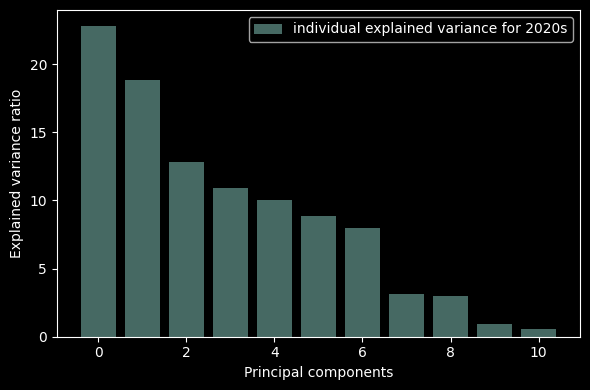

In [ ]:
tot = sum(eig_vals_20s)
var_exp = [(i / tot)*100 for i in sorted(eig_vals_20s, reverse=True)]
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(11), var_exp, alpha=0.5, align='center',
            label='individual explained variance for 2020s')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

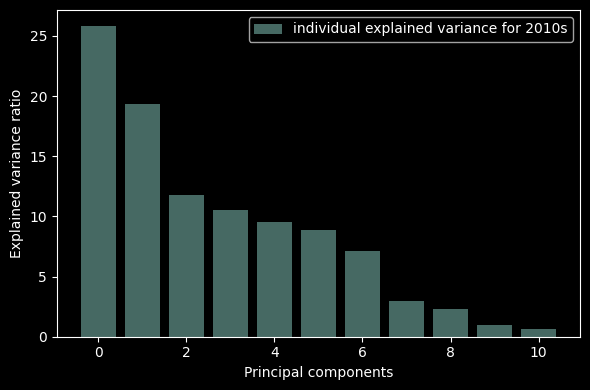

In [ ]:
tot = sum(eig_vals_10s)
var_exp = [(i / tot)*100 for i in sorted(eig_vals_10s, reverse=True)]
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(11), var_exp, alpha=0.5, align='center',
            label='individual explained variance for 2010s')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

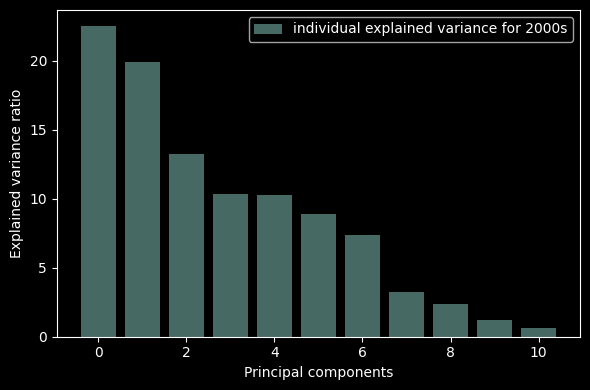

In [ ]:
tot = sum(eig_vals_00s)
var_exp = [(i / tot)*100 for i in sorted(eig_vals_00s, reverse=True)]
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(11), var_exp, alpha=0.5, align='center',
            label='individual explained variance for 2000s')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

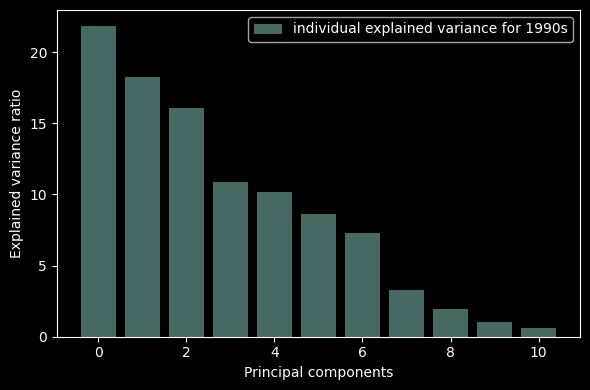

In [ ]:
tot = sum(eig_vals_90s)
var_exp = [(i / tot)*100 for i in sorted(eig_vals_90s, reverse=True)]
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(11), var_exp, alpha=0.5, align='center',
            label='individual explained variance for 1990s')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

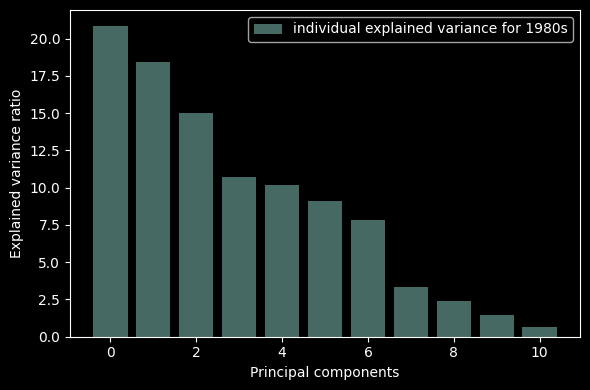

In [ ]:
tot = sum(eig_vals_80s)
var_exp = [(i / tot)*100 for i in sorted(eig_vals_80s, reverse=True)]
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(11), var_exp, alpha=0.5, align='center',
            label='individual explained variance for 1980s')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

<ipython-input-44-8a2418e7b2c5>:3: MatplotlibDeprecationWarning: Passing the emit parameter of set_xlim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  plt.xlim(0,11,1)


Text(0, 0.5, 'Cumulative explained variance')

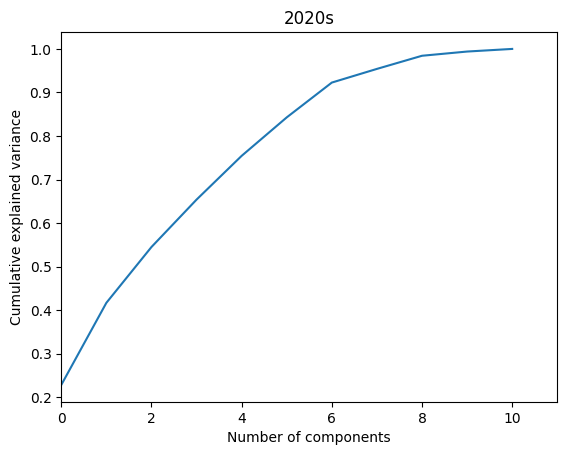

In [ ]:
pca = PCA().fit(x_20s_new)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,11,1)
plt.title("2020s")
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

<ipython-input-45-9daa7fdc5ef9>:3: MatplotlibDeprecationWarning: Passing the emit parameter of set_xlim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  plt.xlim(0,11,1)


Text(0, 0.5, 'Cumulative explained variance')

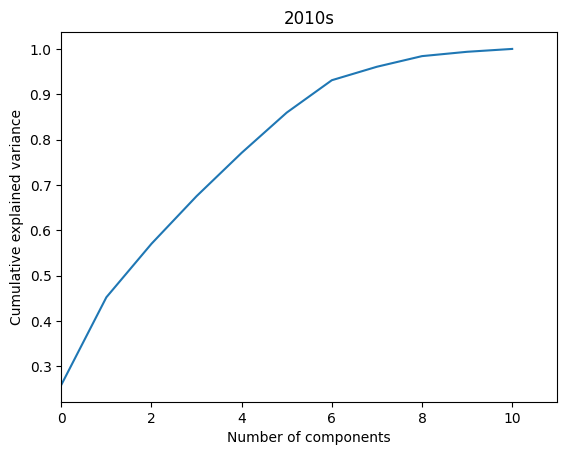

In [ ]:
pca = PCA().fit(x_10s_new)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,11,1)
plt.title("2010s")
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

<ipython-input-46-60da2fc91981>:3: MatplotlibDeprecationWarning: Passing the emit parameter of set_xlim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  plt.xlim(0,11,1)


Text(0, 0.5, 'Cumulative explained variance')

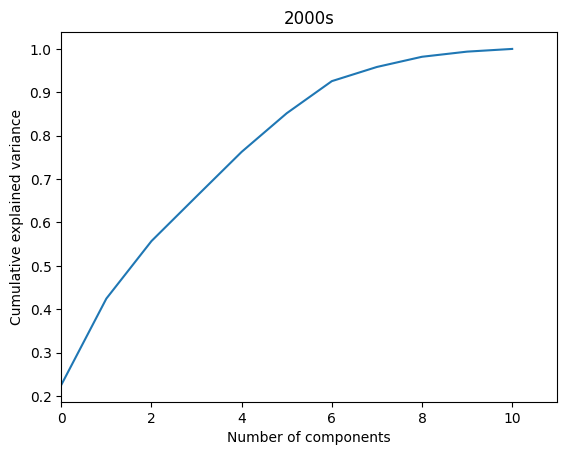

In [ ]:
pca = PCA().fit(x_00s_new)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,11,1)
plt.title("2000s")
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

<ipython-input-47-5a3500c7c879>:3: MatplotlibDeprecationWarning: Passing the emit parameter of set_xlim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  plt.xlim(0,11,1)


Text(0, 0.5, 'Cumulative explained variance')

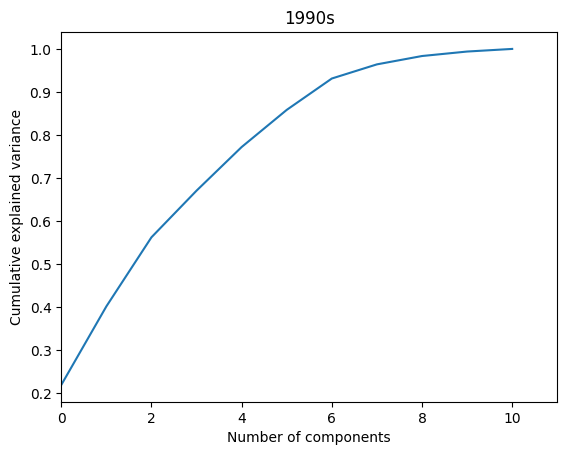

In [ ]:
pca = PCA().fit(x_90s_new)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,11,1)
plt.title("1990s")
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

<ipython-input-48-9117b2ba5f60>:3: MatplotlibDeprecationWarning: Passing the emit parameter of set_xlim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  plt.xlim(0,11,1)


Text(0, 0.5, 'Cumulative explained variance')

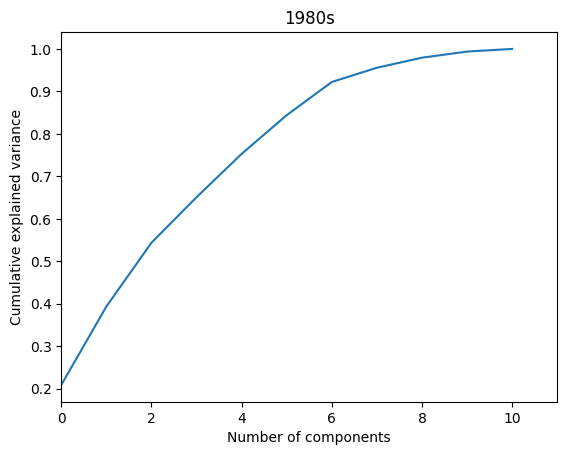

In [ ]:
pca = PCA().fit(x_80s_new)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,11,1)
plt.title("1980s")
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [ ]:
x_reduced = x_new.dot(eig_vecs[:,:10])
x_reduced


array([[-2.23761382e+00,  9.92238042e-01, -1.57012850e-01, ...,
         5.51358455e-01,  1.16063136e-01, -1.82901669e+00],
       [ 1.55584656e+00, -1.65448859e+00, -3.79389992e-01, ...,
         7.03665484e-01, -6.49614242e-02, -1.98107463e-01],
       [ 1.55048388e-01, -3.14727720e-01, -3.61304831e-01, ...,
        -2.42629349e+00,  1.23760375e+00, -7.20052655e-01],
       ...,
       [ 5.58678601e+00,  5.35554423e+00,  1.62291216e-04, ...,
         1.54026258e+00,  1.91041402e+00, -1.95519334e+00],
       [ 6.67150874e+00,  5.36640522e+00,  2.22259842e-01, ...,
         8.84902598e-02,  2.94256613e+00, -1.44344817e+00],
       [ 2.25558370e+00,  3.19023535e+00,  2.75131972e-01, ...,
         4.93889987e-01, -3.60895584e-01, -1.01433075e+00]])

In [ ]:
x_reduced.shape

(7768, 10)

In [ ]:
# Fit Linear Regression Model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

features = x_reduced #x
labels = df.loc[:, ['win']].values

# print(labels)

In [ ]:
# graphs
print(labels)
win_features = x_reduced[np.where(labels == 1), :]
print(win_features[0,:])
print(x_reduced.shape)

[[1]
 [1]
 [1]
 ...
 [0]
 [0]
 [0]]
[[-2.23761382e+00  9.92238042e-01 -1.57012850e-01 ...  5.51358455e-01
   1.16063136e-01 -1.82901669e+00]
 [ 1.55584656e+00 -1.65448859e+00 -3.79389992e-01 ...  7.03665484e-01
  -6.49614242e-02 -1.98107463e-01]
 [ 1.55048388e-01 -3.14727720e-01 -3.61304831e-01 ... -2.42629349e+00
   1.23760375e+00 -7.20052655e-01]
 ...
 [ 7.78818777e+00  7.74809291e+00 -6.54035037e-02 ...  5.37168885e-01
   2.59804930e+00 -2.04396404e+00]
 [ 8.64689760e+00  8.61692642e+00  7.37181588e-02 ...  1.40011668e+00
   2.25192243e+00 -1.58557011e+00]
 [ 1.67091056e-01  2.77386070e-01  1.30475157e-01 ... -1.11451326e+00
   6.26572774e-04  5.61603613e-01]]
(7768, 10)


In [ ]:
# Split data into train and test
xtrain, xtest, ytrain, ytest = train_test_split(features, labels, test_size=0.2, random_state=42)
print(xtrain.shape)
print(ytrain)

lin_reg = LinearRegression().fit(xtrain, ytrain)

In [ ]:
from sklearn.metrics import classification_report, mean_squared_error, r2_score

ypreds_test = lin_reg.predict(xtest)

print("Testing:")
print("MSE:", mean_squared_error(ytest, ypreds_test))
print("R2:", r2_score(ytest, ypreds_test))

print("")
# ypreds_train = lin_reg.predict(xtrain)

# classification_report(ytest, ypreds_test)


ypreds_train = lin_reg.predict(xtrain)

print("Training:")
print("MSE:", mean_squared_error(ytrain, ypreds_train))
print("R2:", r2_score(ytrain, ypreds_train))

print("preds")
print(ypreds_train)
print("actual")
print(ytrain)



Testing:
MSE: 66.42745905837047
R2: 0.6901064300747726

Training:
MSE: 66.0295172508722
R2: 0.6941763666204809
preds
[[-13.54753681]
 [ -5.29261532]
 [ -4.97078625]
 ...
 [ 10.42984905]
 [-14.23048467]
 [ -2.55031808]]
actual
[[ -9]
 [-19]
 [  5]
 ...
 [  4]
 [ -2]
 [ -5]]


In [ ]:
from sklearn.metrics import classification_report, mean_squared_error, r2_score
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression().fit(xtrain, ytrain)


ypreds_test = log_reg.predict(xtest)

print("Testing:")
print("MSE:", mean_squared_error(ytest, ypreds_test))
print("R2:", r2_score(ytest, ypreds_test))

print("")
# ypreds_train = lin_reg.predict(xtrain)




ypreds_train = log_reg.predict(xtrain).reshape(-1,1)

print("Training:")
print("MSE:", mean_squared_error(ytrain, ypreds_train))
print("R2:", r2_score(ytrain, ypreds_train))


print("")
print("preds")
print(ypreds_train)
print("actual")
print(ytrain)

Testing:
MSE: 0.15958815958815958
R2: 0.3615617048346056

Training:
MSE: 0.16108786610878661
R2: 0.35564312890589056

preds
[[0]
 [0]
 [0]
 ...
 [1]
 [0]
 [0]]
actual
[[0]
 [0]
 [1]
 ...
 [1]
 [0]
 [0]]


/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
from sklearn.metrics import f1_score, precision_score

print(classification_report(ytest, ypreds_test))
# f1_score(ytest, ypreds_test)

              precision    recall  f1-score   support

           0       0.84      0.84      0.84       786
           1       0.84      0.84      0.84       768

    accuracy                           0.84      1554
   macro avg       0.84      0.84      0.84      1554
weighted avg       0.84      0.84      0.84      1554



In [ ]:
 print(classification_report(ytrain, ypreds_train))

              precision    recall  f1-score   support

           0       0.84      0.84      0.84      3098
           1       0.84      0.84      0.84      3116

    accuracy                           0.84      6214
   macro avg       0.84      0.84      0.84      6214
weighted avg       0.84      0.84      0.84      6214



In [ ]:
from sklearn import svm

clf = svm.SVC(kernel='poly', degree=4)
clf.fit(xtrain, ytrain)

train_preds = clf.predict(xtest)




/usr/local/lib/python3.9/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(classification_report(ytest, train_preds))

              precision    recall  f1-score   support

           0       0.53      0.85      0.65       786
           1       0.59      0.23      0.33       768

    accuracy                           0.54      1554
   macro avg       0.56      0.54      0.49      1554
weighted avg       0.56      0.54      0.49      1554



In [ ]:
from sklearn.ensemble import RandomForestClassifier

xtrain, xtest, ytrain, ytest = train_test_split(features, labels, test_size=0.2, random_state=42)

# instantiate model
model = RandomForestClassifier(n_estimators=200, random_state=0)
# fit model
model.fit(xtrain, ytrain)



<ipython-input-112-445b05e25de5>:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(xtrain, ytrain)


RandomForestClassifier(n_estimators=200, random_state=0)

In [ ]:
importances = model.feature_importances_

# visualization
cols = col_names
(pd.DataFrame(importances, cols, columns = ['importance'])
 .sort_values(by='importance', ascending=True)
 .plot(kind='barh', figsize=(4,10)))

ValueError: ignored

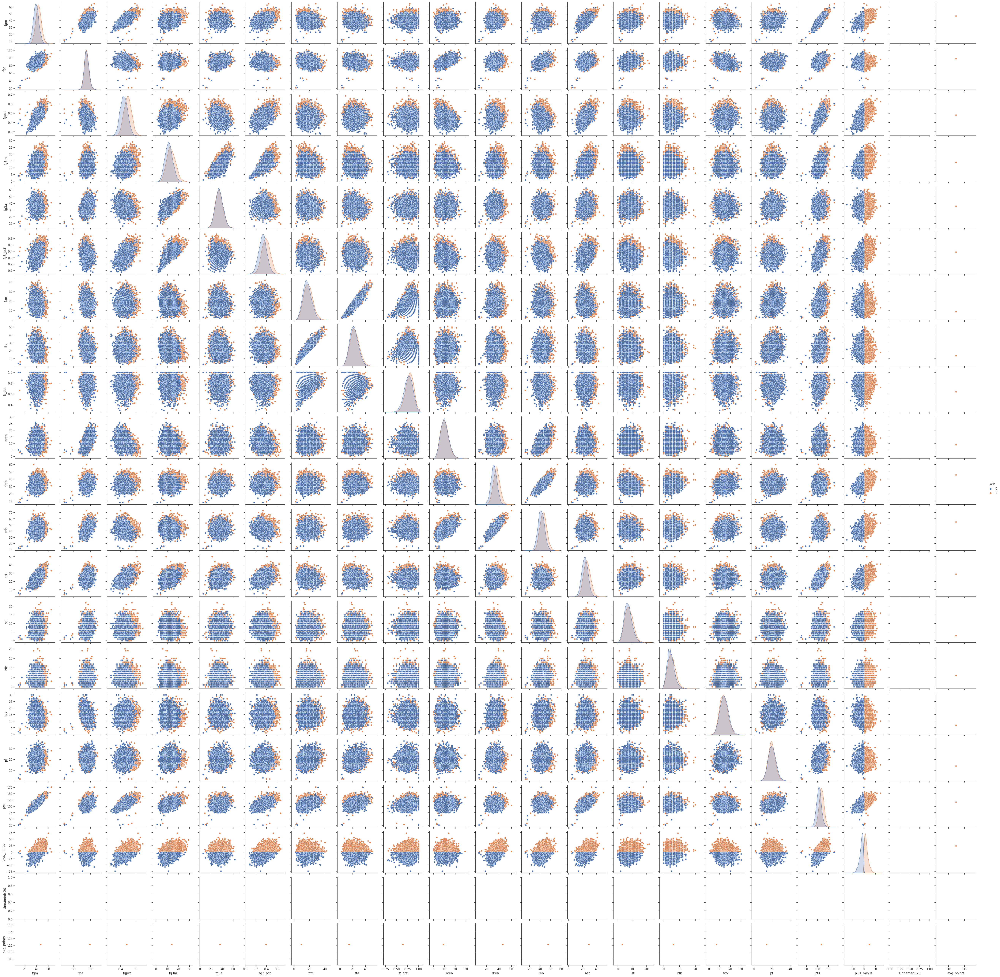